# Project Assignment 2

Group 27:
- s233576 Beatriz Braga
- s232829 Leonardo Debarba Bassani
- s242962 Mátyás András

In [1]:
import networkx as nx
import pickle
import json
import community as community_louvain 
from fa2_modified import ForceAtlas2
import matplotlib.pyplot as plt
import pandas as pd
import os
from urllib.parse import quote, unquote
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud
import numpy as np
from nltk.probability import FreqDist

# Part 1: Genres and communities and plotting 

The questions below are based on Lecture 7, part 2.

### Write about genres and modularity.

<div style="padding: 15px; border: 2px solid transparent; border-color: transparent; margin-bottom: 15px; border-color: #0078d7; border-radius:4px; max-width: 96%; overflow: hidden;">

**Modularity** is a measure of how well we can divide a network into different groups or communities, i.e measures its strength of division by determining if the nodes within a group are more densely sonnected to each other than to the rest of the nodes outside their group. It can help us identify community structures in networks, such as genre in the country music network, where it is plausible to believe that artis that perform the same genre of music collaborate more often than with those from different genres.

Mathematically, modularity compares the density of links within a community to the density expected in a random network. Ranging from -1 to 1, a higher modularity score suggests strong community structures, whereas a score near zero or negative indicates weak or no community structure.

</div>

### Detect the communities, discuss the value of modularity in comparison to the genres.

Load country artist network and genre information

In [2]:
# load the undirected graph from pickle file
with open('artists_undirected.gpickle', 'rb') as f:
    artists_undirected = pickle.load(f)

# remove self-loops and multi-edges if any exist
artists_undirected.remove_edges_from(nx.selfloop_edges(artists_undirected))

# load the genre information from .txt file
with open('artists_genres_dictionary.txt', 'r') as f:
    genres_dict = json.load(f)

# keep only nodes for which we have genre information
artists_undirected = artists_undirected.subgraph(genres_dict.keys())

# discarding nodes with no neighbors
artists_undirected = artists_undirected.subgraph([node for node in artists_undirected.nodes() if artists_undirected.degree(node) > 0])

**Partition of the network into genres**

Characterize each node's genre as the first genre in its list of genres

In [3]:
# add genre characteristics to the nodes and separate the graph into genre communities
from collections import defaultdict
genre_communities = defaultdict(list)
for node in artists_undirected.nodes():
    genre = genres_dict[node][0]
    artists_undirected.nodes[node]['genre'] = genre
    genre_communities[genre].append(node)


Function that calculates modularity

In [4]:
def genre_modularity(graph, genres_dict):
    """
    Calculate the modularity of the graph based on the genre information of the nodes.
    """
    modularity = 0.0
    L = graph.number_of_edges()  # Total number of edges in the graph
    for genre, nodes in genres_dict.items():
        genre_subgraph = graph.subgraph(nodes)
        L_c = genre_subgraph.number_of_edges()  # Number of edges within the genre community
        K_c = sum(dict(graph.degree(nodes)).values())  # Sum of degrees of nodes within the genre community
        modularity += (L_c / L) - ((K_c / (2 * L)) ** 2)
    
    return modularity


In [5]:
print(f"Modularity of the graph considering first genre: {genre_modularity(artists_undirected, genre_communities)}")

Modularity of the graph considering first genre: 0.07072543748664417


<div style="padding: 15px; border: 2px solid transparent; border-color: transparent; margin-bottom: 15px; border-color: #0078d7; border-radius:4px; max-width: 96%; overflow: hidden;">

The modularity scored obtained for the artists network based on the first genre of each artist suggests a relatively weak community structure. While this value is positive, indicating that some clustering by genre exists, it is close to 0, which indicates that the connections between artists of the same genre do not seem to be significantly stronger than those between artists of different genres.
</div>

Characterise each node's genre as the first non-country genre in its list (if there is any)

In [6]:
# If we consider the first genre that is not country
# add genre characteristics to the nodes and separate the graph into genre communities

non_country_genre_communities = defaultdict(list)
for node in artists_undirected.nodes():
    if len(genres_dict[node])>1 and genres_dict[node][0] == 'country':
        genre = genres_dict[node][1]
    else:
        genre = genres_dict[node][0] 
    artists_undirected.nodes[node]['non_country_genre'] = genre
    non_country_genre_communities[genre].append(node)

print(f"Modularity of the graph considering first non-country genre: {genre_modularity(artists_undirected, non_country_genre_communities)}")

Modularity of the graph considering first non-country genre: 0.08419484501141825


<div style="padding: 15px; border: 2px solid transparent; border-color: transparent; margin-bottom: 15px; border-color: #0078d7; border-radius:4px; max-width: 96%; overflow: hidden;">

The modularity of the country artist network, when considering the first genre that is not country, slightly improved modularity score compared to when only the first genre was considered. This improvement suggests a somewhat stronger community structure when focusing on non-country genres. Once country is excluded as the primary genre, the remaining genres show a more distinct grouping, with artists collaborating more frequently within their respective non-country genres. 

By looking ar the histograms below, we can see that country is the first genre for the majority of the nodes, with the other gneres being considerably under represented, which reflects the nature of the network. However, when considering the first non-country genre, we can indentify more artists beloning to different genres and capture a broader spectrum of genres that may have more defined collaboration patterns.

Nonetheless, the modularity in this case is still low, indicating that while there is some level of community structure, there is also significant overlap between different genres, suggesting that collaborations occur across genre boundaries,
</div>

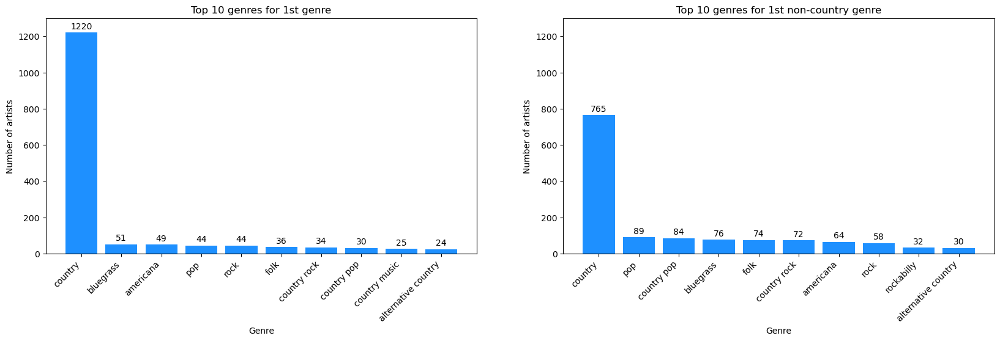

In [7]:
# plot top 10 genres for 1st genre and 1st non country genre
fig, axs = plt.subplots(1, 2, figsize=(20,5))
genre_freq =  {genre: len(artists) for genre, artists in genre_communities.items()}
top10_genres = dict(sorted(genre_freq.items(), key=lambda x: x[1], reverse=True)[:10])
axs[0].bar(top10_genres.keys(), top10_genres.values(), color='dodgerblue')
axs[0].set_title('Top 10 genres for 1st genre')
axs[0].set_xticks(range(len(top10_genres)))
axs[0].set_xticklabels(top10_genres.keys(), rotation=45, ha='right')
axs[0].set_ylabel('Number of artists')
axs[0].set_xlabel('Genre')
axs[0].set_ylim(0, 1300)
for i, v in enumerate(top10_genres.values()):
    axs[0].text(i, v + 10, str(v), ha='center', va='bottom', fontsize=10)

genre_freq = {genre: len(artists) for genre, artists in non_country_genre_communities.items()}
top10_genres = dict(sorted(genre_freq.items(), key=lambda x: x[1], reverse=True)[:10])
axs[1].bar(top10_genres.keys(), top10_genres.values(), color='dodgerblue')
axs[1].set_title('Top 10 genres for 1st non-country genre')
axs[1].set_xticks(range(len(top10_genres)))
axs[1].set_xticklabels(top10_genres.keys(), rotation=45, ha='right')
axs[1].set_ylabel('Number of artists')
axs[1].set_xlabel('Genre')
axs[1].set_ylim(0, 1300)
for i, v in enumerate(top10_genres.values()):
    axs[1].text(i, v + 10, str(v), ha='center', va='bottom', fontsize=10)

plt.show()



Find communities using [the Python Louvain-algorithm implementation](http://perso.crans.org/aynaud/communities/)

In [8]:
louvain_partition = community_louvain.best_partition(artists_undirected)
nx.set_node_attributes(artists_undirected, louvain_partition, 'louvain_community')
louvain_modularity = community_louvain.modularity(louvain_partition, artists_undirected)
print(f"Louvain modularity: {louvain_modularity}")


Louvain modularity: 0.38953167575337894


<div style="padding: 15px; border: 2px solid transparent; border-color: transparent; margin-bottom: 15px; border-color: #0078d7; border-radius:4px; max-width: 96%; overflow: hidden;">

The modularity of the partitioning of the artists network obtained using the Louvain algorithm is considerably higher than the ones obtained based solely on the genres. This suggests that the algorithm was able to find stronger community structures in the network than the genre-based ones, which could mean that there are additional patterns in the data that are not captured simply by these genre labels. The relationships within the network can be influenced by different factors such as shared influences, projects, or similar artistic styles, rather than just genre.
</div>

### Calculate the matrix $D$ and discuss your findings.

Comparing the communities found by the Louvain-algorithm with the music genres by creating a matrix confusion matrix $D$ with dimension ($G \times C$), where G is the 7 most common genres and C is the 7 most common communities. 
We set entry $D(i,j)$ to be the number of nodes that genre $i$ has in common with community $j$. 

Calculate G

In [9]:
# top 7 most common genres ordered by the number of artists in the genre community
genre_count = {key: len(value) for key, value in non_country_genre_communities.items()}
top7_genres = dict(sorted(genre_count.items(), key=lambda x: x[1], reverse=True)[:7])

G = top7_genres.keys()

Calculate C

In [10]:
# top 7 most common communities ordered by the number of artists in the community of louvain partition
partition_lists = defaultdict(list)
for key, value in louvain_partition.items():
    partition_lists[value].append(key)

community_count = {key: len(value) for key, value in partition_lists.items()}
top7_communities = dict(sorted(community_count.items(), key=lambda x: x[1], reverse=True)[:7])

C = top7_communities.keys()

Calculate matrix D

In [11]:
# create matrix of genre-community intersections
D = pd.DataFrame(0, index=G, columns=C)
for genre in G:
    for community in C:
        D.loc[genre, community] = len(set(non_country_genre_communities[genre]).intersection(partition_lists[community]))
print('Confusion matrix D:')
print(D)

Confusion matrix D:
               9    5    2   0   10  3   8 
country       313  221  139  43  25  12   2
pop            35   10   31  12   1   0   0
country pop    64   10    8   0   1   1   0
bluegrass       6   60    2   8   0   0   0
folk            6   17   15  35   0   0   1
country rock   31   14   10  15   0   2   0
americana       8   10    5  40   0   1   0


<div style="padding: 15px; border: 2px solid transparent; border-color: transparent; margin-bottom: 15px; border-color: #0078d7; border-radius:4px; max-width: 96%; overflow: hidden;">

The confusion matrix **D** provides a visual representation of how well the genre classifications align with the community structures. The strong representation of the country genre across the different communities is expected considering its dominance in this particular network. However, the highest counts for this genre appear particularly in communities 9, 5 and 2, suggesting that these communities might be more heavily influenced by country music styles than the others.
Additionally, the presence of the counrty pop genre in community 9 and its minimal representation in other communities highlights a considerable overlap between this community and the genre. 
The bluegrass genre exhibits a high count in community 5, which could suggest that this community has a particular affinity for bluegrass influences or artists. In contrast, genres like folk and americana display a more dispersed representation across multiple communities. This might imply that there is a wider range of different collaborations within the network.
</div>

Considering all genres associated with each node

In [12]:
# create matrix of genre-community intersections
D_all_genres = pd.DataFrame(0, index=G, columns=C)
for node in artists_undirected.nodes():
    genres = genres_dict[node]
    community = louvain_partition[node]

    # ignore nodes not in top 7 communities
    if community not in C:
        continue

    for genre in genres:
        # count only if genre is one of the top 7 genres
        if genre in G:
            D_all_genres.loc[genre, community] += 1
            
print('Confusion matrix D considering all genres associated with each node:')
print(D_all_genres)

Confusion matrix D considering all genres associated with each node:
               9    5    2    0   10  3   8 
country       480  386  380  187  28  21   4
pop            55   21   52   26   1   2   0
country pop    76   12   15    3   1   2   0
bluegrass       9   85    9   25   0   0   0
folk           11   41   35   89   0   1   1
country rock   59   27   22   57   2   3   0
americana      14   26   17   98   0   1   0


<div style="padding: 15px; border: 2px solid transparent; border-color: transparent; margin-bottom: 15px; border-color: #0078d7; border-radius:4px; max-width: 96%; overflow: hidden;">

If we consider all genres associated with each node instead of only the first non-country one, we can see a more refined representation of the relationshsips in the network and more complex interactions among the top genres. The overall counts for the country genre signficantly increased, as expected, considering most artists have country in its genre list. This reflects the genre's influence across the communities and suggests that country artists are likely to collaborate within various contexts.
The country pop genre shows a big representation in community 9, reinforcing the idea that artists in this community are likely to blend country and pop influences. Additionally, bluegrass appears mostly in community 5, indicating its appeal within that group.
</div>


### Plot the communities and comment on your results.

Obtain positions for network nodes

In [13]:
# position nodes using Force Atlas 2
forceatlas2 = ForceAtlas2(verbose=False, scalingRatio=0.2)
positions = forceatlas2.forceatlas2_networkx_layout(artists_undirected, pos=None, iterations=2000)

Plot network with louvain communities colored

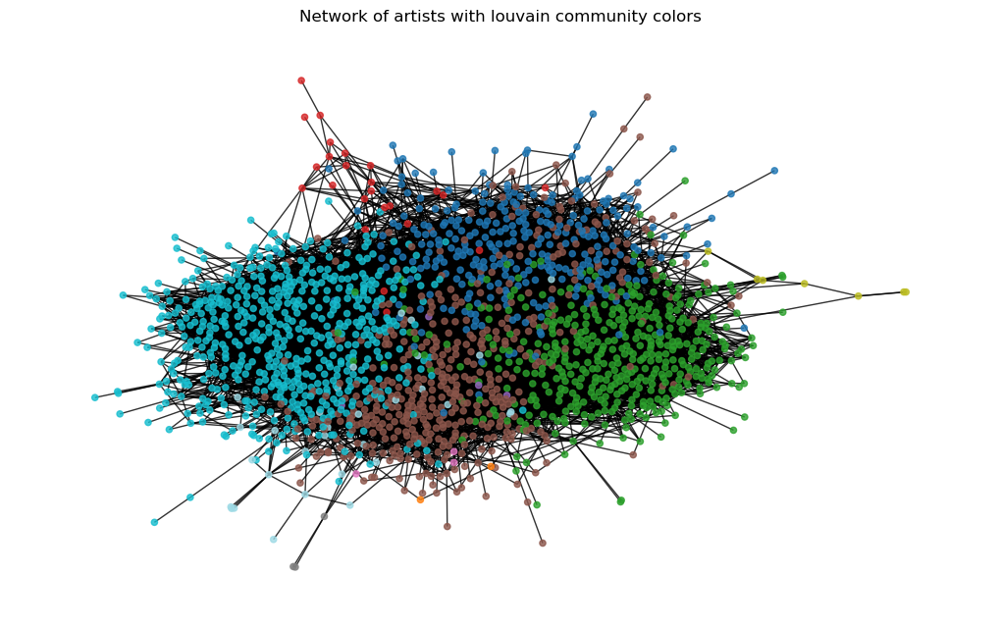

In [14]:
# node colors based on community
node_colors = [louvain_partition[node] for node in artists_undirected.nodes()]

# plot the network with louvain community colors
plt.figure(figsize=(10,6))
nx.draw(artists_undirected, pos=positions, with_labels=False, node_color=list(louvain_partition.values()), node_size=20, cmap=plt.cm.tab20, alpha=0.8)
plt.title('Network of artists with louvain community colors')
plt.show()

Plot network with genre communities colored

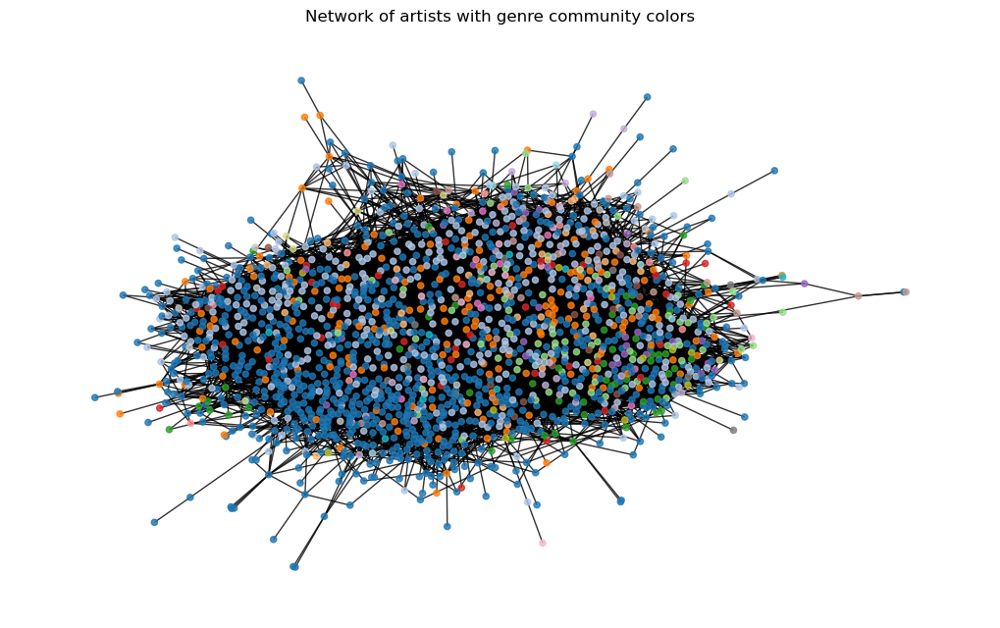

In [15]:
# assign numbers to genres to get colors
genres = list(nx.get_node_attributes(artists_undirected, 'non_country_genre').values())
genre_codes, unique_genres = pd.factorize(genres)

# Set the node colors based on genre codes
plt.figure(figsize=(10,6))
node_colors = [genre_codes[i] for i in range(len(genres))]
# plot the network with genre community colors
nx.draw(artists_undirected, pos=positions, with_labels=False, node_color=node_colors, node_size=20, cmap=plt.cm.tab20, alpha=0.8)
plt.title('Network of artists with genre community colors')
plt.show()

<div style="padding: 15px; border: 2px solid transparent; border-color: transparent; margin-bottom: 15px; border-color: #0078d7; border-radius:4px; max-width: 96%; overflow: hidden;">

The first plot, where the network is colored baed on the Louvain communities, depicts a clear separation among the top 4 communities with four predominant colors indicating distinct community structures, while one additional color appears more mixed in between. 

In contrast, the second plot, where the colors are based on the nodes' first non-country genre, reveals a considerably blended representation. While the country genre domiates the network, the lack of separation among the colors shows a mixing of genres among artists. 

These observations align with the modularity scores: higher modularity means stronger community structure for a partition of a network.
</div>



# Part 2: TF-IDF to understand genres and communities 

The questions below  are based on Lecture 7, part 2, 4, 5, 6 (and a little bit on part 3).

### Explain the concept of TF-IDF in your own words and how it can help you understand the genres and communities.

<div style="padding: 15px; border: 2px solid transparent; border-color: transparent; margin-bottom: 15px; border-color: #0078d7; border-radius:4px; max-width: 96%; overflow: hidden;">

**TF** (Term Frequency) measures how often a term appears in a document compared to the total number of terms in that document and can be represented as a raw count. However, using alternatives like term frequency normalization might be preferable, as it considers variations in document length, allowing a more accurate comparison of term importance across different texts.

**IDF** stands for **Inverse Document Frequency** and measures how important a word is to a particular document within a larger set of documents. It evaluates how rare a term is across all documents, by calculating the inverse of the number of documents containing that term. The idea is that words that appear in many documents, like common stop words and connectors, are less meaningful, because they do not provide unique information about any specific document. Conversely, words that appear in fewer documents are considered more informative and relevant to that document's content.

The logarithm in IDF calculations reduces the influence of common terms, preventing them from dominating the scores. It also ensures that increases in frequency have less effect on importance, making it easier to compare terms and understand their significance in a document.

Using IDF reduces the necessity for stopword removal because as stopwords are common terms, they will have a low IDF score and consequently a minimal contribution to the overall TF-IDF score, which won't significantly affect the analysis.
</div>

### Calculate and visualize TF-IDF for the genres and communities.

Load the wikipedia pages' content of the country artists 

In [16]:
# Load the Wikipedia pages' content of the country artists in the top 15 genres
folder = os.listdir("country_music_performers")
artist_texts = {}
for file_name in folder:
    with open(f"country_music_performers/{file_name}", 'r', encoding='utf-8') as file:
        artist_name = unquote(file_name).replace(".txt", "").replace("_", " ")
        #check if the artist is in the graph
        if artist_name not in artists_undirected.nodes:
            continue
        content = file.read()
        artist_texts[artist_name] = content

Function to process text in the wikipedia pages (tokenization, removing ponctuation, setting to lower case, removing stopwords, lemmatizing) and add words to its community list

In [17]:
stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

def process_text(text):
    """
    Process the text by tokenizing, removing punctuation, setting to lowercase, removing stopwords, and lemmatizing.
    """
    # tokenize text
    words = word_tokenize(text)
    # remove punctuation
    words = [word for word in words if word.isalpha()]
    # set to lowercase
    words = [word.lower() for word in words]
    # remove stopwords
    words = [word for word in words if word not in stop_words]
    # lemmatize words
    words = [lemmatizer.lemmatize(word) for word in words]
    return words   



Function to separate the words by group

In [18]:
def get_group_words(artist_texts, partition):
    """
    Get the words of the Wikipedia pages of the artists in each partition.
    """
    group_words = defaultdict(list)
    for artist, text in artist_texts.items():
        group = artists_undirected.nodes[artist].get(partition)
        words = process_text(text)
        # add words to the genre
        group_words[group].extend(words)
    return group_words

#### TF-IDF for genres

Create TF lists for each of the 15 most popular genres

In [19]:
# get top 15 genres
genre_count = {key: len(value) for key, value in non_country_genre_communities.items()}
top15_genres = dict(sorted(genre_count.items(), key=lambda x: x[1], reverse=True)[:15]).keys()

# select artists in the top 15 genres
genre_texts = {artist: text for artist, text in artist_texts.items() 
               if artists_undirected.nodes[artist].get('non_country_genre') in top15_genres}

# get the words of the Wikipedia pages of the artists in each genre
genre_words = get_group_words(genre_texts, 'non_country_genre')

# create tf lists for each genre
tf_genre = {}
for genre, words in genre_words.items():
    tf_genre[genre] = pd.Series(words).value_counts()


In [20]:
# top 15 words for each genre
print('Top 15 words for each genre')
for genre, tf in tf_genre.items():
    top15= tf.head(15)
    print(f'{genre}: {", ".join(top15.index)}')

Top 15 words for each genre
folk: ref, cite, album, song, music, center, country, dylan, category, http, year, american, record, award, folk
country: country, ref, cite, album, music, row, song, single, category, center, year, record, chart, award, artist
alternative country: ref, cite, album, country, band, music, category, song, award, record, web, american, new, year, released
country music: center, ref, country, category, music, cite, record, american, row, song, album, year, artist, http, award
bluegrass: ref, cite, album, country, music, bluegrass, year, category, song, award, band, record, american, row, musician
southern rock: ref, cite, album, band, country, music, song, rock, alabama, daniel, category, chart, skynyrd, group, single
neotraditional country: ref, country, cite, album, music, song, year, single, award, strait, released, chart, record, artist, web
country pop: ref, cite, country, album, music, song, award, year, single, chart, released, billboard, artist, category

<div style="padding: 15px; border: 4px solid transparent; border-color: transparent; margin-bottom: 10px; border-color: #0078d7; border-radius:4px; max-width: 96%; overflow: hidden;">

The top 15 words for each of the top 15 genres include both general music terms and genre-specific words. Words like *album*, *song*, *music* and *record* appear consistently across all genres, reflecting typical industry language. In contrast, **Folk** features terms like <i>dylan</i> and *american*, which relate to its history and cultural roots, while **Southern Rock** includes *alabama* and *skynyrd*, highlighting influential bands and regional connections. 
Additionally, considering many of these genres are related to country and the artists considered were specifically retrieved from the country music genre wikipedia page, it is not surprising that *country* frequently appears. Notably, words like *ref*, *cite* and *http* also recur, likely due to citation and metadata (wiki-syntax) that appear frequently in the wikitext retrieved from Wikipedia pages.
<div>

Draw wordcloud for each of the top 15 genres

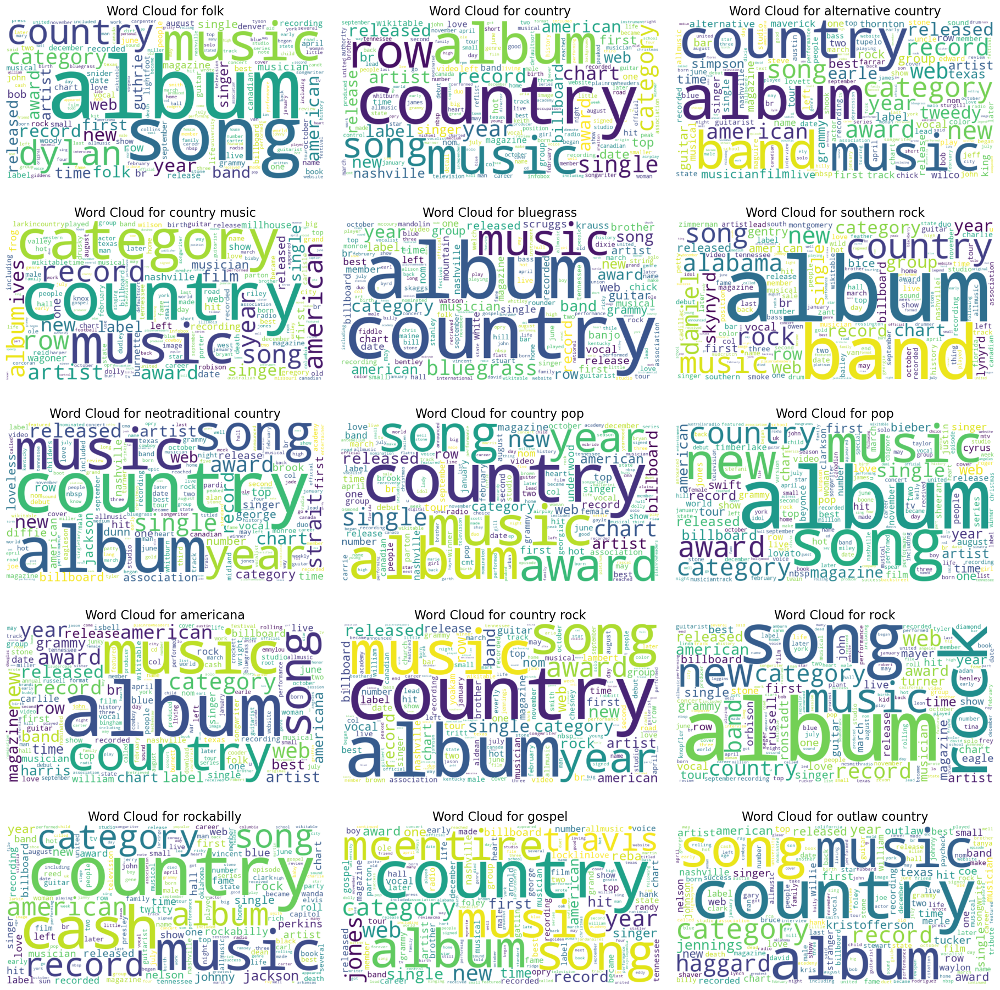

In [31]:
genre_strings = {}
for genre, tf in tf_genre.items():
    # remove wiki-syntax 
    wiki_syntax = ['ref', 'cite', 'title', 'url', 'class', 'div', 'span', 'style', 'align', 'http', 'center']
    tf = tf[~tf.index.isin(wiki_syntax)]
    
    # repeat each word by its frequency count 
    genre_strings[genre] = ' '.join([word for word, freq in tf.items() for _ in range(freq)])

fig, axs = plt.subplots(5, 3, figsize=(20,20))

for i, (genre, text) in enumerate(genre_strings.items()):
    # create word cloud
    wordcloud = WordCloud(width=800, height=400, collocations=False, background_color='white').generate(text)
    ax = plt.subplot(5, 3, i + 1)
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis('off')
    plt.title(f"Word Cloud for {genre}", fontsize=16)

plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05, hspace=0.1, wspace=0.05) 
plt.show()

<div style="padding: 15px; border: 4px solid transparent; border-color: transparent; margin-bottom: 10px; border-color: #0078d7; border-radius:4px; max-width: 96%; overflow: hidden;">

The wordclouds generated for each genre visually illustrate the most prominent terms, highlighting the top 15 words identified in the frequency analysis. Thus, we can reieterate that the bigger i.e. more frequent words are more general music terms. However, we can also see that some words that are closely related to the specific genres are smaller, which means even though they are meaningful they appear only a few times in the texts. For instance, *Canada* in the **Folk** wordcloud and *banjo* in the **Bluegrass**' reflect cultural aspects of the genres, despite their few occurences in the texts. It is also worth noting that any prevalent wiki text was excluded from the analysis, ensuring that only relevant vocabulary is represented.
</div>

Calculate IDF for each word

In [29]:
# Calculate document frequency for each word
doc_freq = defaultdict(int)
for tf in tf_genre.values():
    for word in tf.index:
        doc_freq[word] += 1

# Calculate IDF for each word
idf_genre = {word: np.log(15 / df) for word, df in doc_freq.items()}

The natural logarithm (base $e$) was used. However, the choice of base is not very important as it only affects the scale of the idf values but does not change their relative ranking, which is what is relevant for tf-idf calculation.

Calculate TF-IDF for each genre

In [30]:
# Calculate TF-IDF for each genre
tfidf_genre = {}
for genre, tf in tf_genre.items():
    tfidf_genre[genre] = {word: tf[word] * idf_genre[word] for word in tf.index}


In [32]:
# list top 10 words for each genre based on TF-IDF
print('Top 10 words for each genre based on TF-IDF')
for genre, tfidf in tfidf_genre.items():
    top10 = pd.Series(tfidf).sort_values(ascending=False).head(10)
    print(f'{genre}: {", ".join(top10.index)}')
    

Top 10 words for each genre based on TF-IDF
folk: guthrie, heylin, tallest, giddens, snider, dylan, macneil, kit, lightfoot, leahy
country: azar, wrestling, mccreery, johner, wick, wwe, tna, corbin, storer, jeffreys
alternative country: tweedy, heidorn, shook, farrar, thornton, tupelo, maguire, gourd, sadies, disarmer
country music: millhouse, frog, ives, bowes, burnette, donahew, gregory, burl, drusky, bixby
bluegrass: thile, flatt, hull, chick, krauss, mccoury, grascals, duffey, mcbryde, maine
southern rock: bice, zant, skynyrd, zimmerman, lynyrd, rossington, mudcrutch, gentry, wilkeson, feather
neotraditional country: eagleson, diffie, childers, goans, pardi, jade, singletary, duddy, pitney, annies
country pop: osmond, underwood, mccurdy, ballerini, alaina, andress, bradbery, nettle, shay, ell
pop: bieber, lovato, sheeran, timberlake, rexha, beyoncé, stefani, miley, backstreet, darin
americana: bingham, hackensaw, isbell, cooder, carlile, junky, struthers, erelli, timmins, highwomen

Create a wordcloud per genre based on TF-IDF

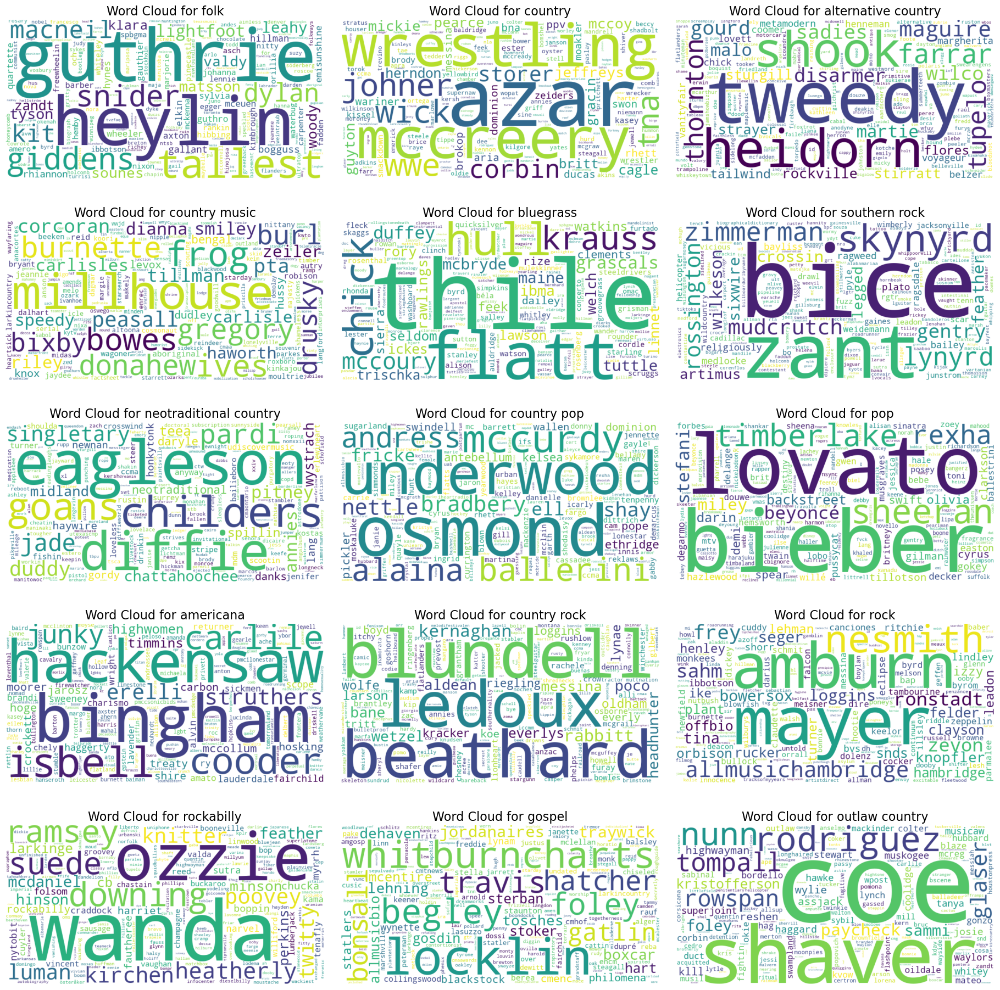

In [33]:
# word cloud for each genre
fig, axs = plt.subplots(5, 3, figsize=(20,20))
for i, (genre, tfidf) in enumerate(tfidf_genre.items()):
    # create word cloud
    wordcloud = WordCloud(width=800, height=400, collocations=False, background_color='white').generate_from_frequencies(tfidf)
    ax = plt.subplot(5, 3, i + 1)
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis('off')
    plt.title(f"Word Cloud for {genre}", fontsize=16)

plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05, hspace=0.1, wspace=0.05) 
plt.show()

<div style="padding: 15px; border: 4px solid transparent; border-color: transparent; margin-bottom: 10px; border-color: #0078d7; border-radius:4px; max-width: 96%; overflow: hidden;">

The top 10 words and the new wordclouds for each genre based on TF-IDF reveal different terms more specific to each genre than the general music words that dominated the representations based on TF. In this visualization genre-specific recognized figures and artists are the domimnant terms, with some more specific vocabulary being emphasized as well. For example, *macneil * in **Folk** and "maine" in **Bluegrass** underscore cultural and musical aspects integral to these genres, even though these terms may not appear as frequently. Similarly, names like *Underwood* in **Country Pop** and *Lovato* in **Pop** are associated with the key artists in the genres Carrie Underwood and Demi Lovatp. The analysis filters out common and less informative text, ensuring each word cloud focuses on vocabulary that defines and differentiates each genr. TF-IDF prioritizes genre defining names and terms that uniquely characterize each genre presenting a much clearer snapshot of each genre's associations.
</div>

#### TF-IDF for Louvain communities

Create TF lists for each of the Louvain communities

In [34]:
# get the words of the Wikipedia pages of the artists in each community
community_words = get_group_words(genre_texts, 'louvain_community')

# create tf lists for each genre
tf_community = {}
for community, words in community_words.items():
    tf_community[community] = pd.Series(words).value_counts()


Calculate IDF for each word

In [43]:
# Calculate document frequency for each word
doc_freq = defaultdict(int)
for tf in tf_community.values():
    for word in tf.index:
        doc_freq[word] += 1

# Calculate IDF for each word
idf_community = {word: np.log(len(tf_community)/ df) for word, df in doc_freq.items()}

Calculate TF-IDF for each community

In [44]:
# Calculate TF-IDF for each community
tfidf_community = {}
for community, tf in tf_community.items():
    tfidf_community[community] = {word: tf[word] * idf_community[word] for word in tf.index}


In [45]:
# list top 10 words for each community based on TF-IDF
print('Top 10 words for each community based on TF-IDF')
for community, tfidf in tfidf_community.items():
    top10 = pd.Series(tfidf).sort_values(ascending=False).head(10)
    print(f'Community {community}: {", ".join(top10.index)}')
    

Top 10 words for each community based on TF-IDF
Community 0: ronstadt, live, grammy, band, folk, award, rolling, stone, dylan, guthrie
Community 9: award, bieber, lovato, underwood, tour, nom, cyrus, timberlake, clarkson, sheeran
Community 2: center, cash, johnny, darin, film, amburn, larkincountry, orbison, russell, jennings
Community 3: aria, australian, storer, kernaghan, blundell, australia, award, apra, cmaa, beccy
Community 4: wopat, schneider, hazzard, gregory, episode, tv, parton, duke, movie, odyssey
Community 5: band, brook, bluegrass, award, grammy, wright, scruggs, krauss, yearwood, nesmith
Community 10: johner, daniel, yellowbird, rasmusen, row, canadian, mahood, shedaisy, scma, hart
Community 7: wilkinson, pistol, amanda, canadian, tyler, ontario, town, belleville, accessed, medicinehat
Community 8: dalhart, jenkins, robison, robertson, carson, mcneil, gooden, victor, eck, vernon
Community 1: cotter, steiner, continuity, adobe, opelika, omg, bridgette, bogard, silverado, 

Create a wordcloud per community based on TF-IDF

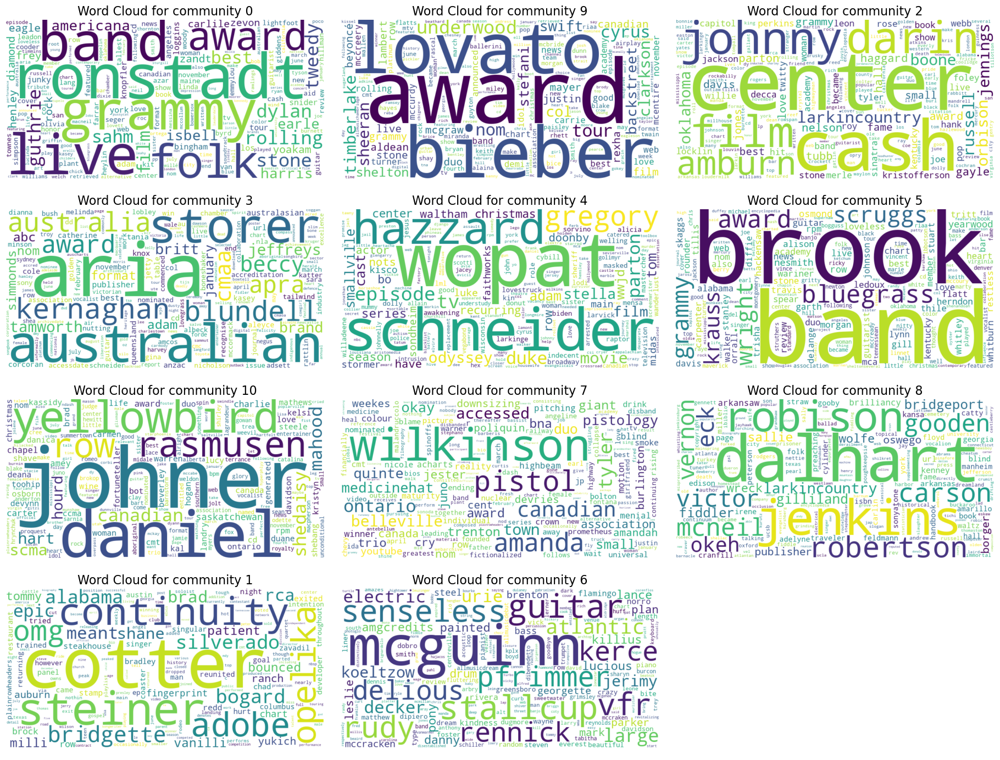

In [51]:
# word cloud for each genre
fig, axs = plt.subplots(4, 3, figsize=(20,15))
for ax in axs.flat:
    ax.axis('off')
for i, (community, tfidf) in enumerate(tfidf_community.items()):
    # create word cloud
    wordcloud = WordCloud(width=800, height=400, collocations=False, background_color='white').generate_from_frequencies(tfidf)
    ax = plt.subplot(4, 3, i + 1)
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis('off')
    plt.title(f"Word Cloud for community {community}", fontsize=16)
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05, hspace=0.1, wspace=0.05) 
plt.show()

<div style="padding: 15px; border: 4px solid transparent; border-color: transparent; margin-bottom: 10px; border-color: #0078d7; border-radius:4px; max-width: 96%; overflow: hidden;">

The TF-IDF analysis for each community offers insightful information about each group of the partition, as we can easily see distinguishing vocabulary within the artists of each group. Each wordcloud highlights unique vocabulary, capturing the essence of each community’s thematic focus. For instance, **Community 0** shows words like *Ronstadt*, *Dylan*, *Rolling Stone* and *Grammy*, likely reflecting a community focused on award-winning and critically acclaimed artists and bands, while **Community 2** has *Johnny Cash*, *film* and *orbison*, which could mean that there is a connection to country artists that are popular in the media industry. **Community 3** with *Aria*, *Australian*, *CMMA* and *APRA* in its top 10 words suggests a strong connection with australian music, awards and recognitions. **Community 5** highlights *Scruggs* and *Bluegrass*, pointing towards a bluegrass genre theme. Similarly, **Community 9** features *Lovato*, *Bieber* and *Cyrus*, showing a focus on current pop music figures, along with terms like *tour* and *award*, emphasizing this icons' influence.

By examining these TF-IDF results, we are thus able to better understand the communities created by the Louvain-Algorithm and the different connections within the entire network.

</div>


### Use the matrix $D$ (Lecture 7, part 2) to dicusss the difference between the word-clouds between genres and communities.


<div style="padding: 15px; border: 4px solid transparent; border-color: transparent; margin-bottom: 10px; border-color: #0078d7; border-radius:4px; max-width: 96%; overflow: hidden;">

The confusion matrix **D** reveals distinctions between genre-based and community-based groupings and xan help us explore how genre associations and community groupings affect word cloud composition. 

As mentioned previsouly, **Comunity 5** seems to be highly related to the **Bluegrass** genre, as not only we have as perdominant terms words related to this genre but there is also a higher count for this genre in this specific community \(60 bluegrass artists in community 5\) and lower counts for the other communities. **Community 9** also shows strong links with the **Pop** genre, presenting current mainstream pop figures (e.g. *Bieber*, *Lovato*)
in its vocabulary and a high document count in the **Pop** and **Country Pop** categories, which reflects shared artist references between mainstream pop and country influences. In **Community 0** we can see a prevalence of documents belonging to the **Folk** and **Americana** genres in the matrix **D** and its word cloud highlights several award-related terms, underscoring a focus on acclaimed folk and Americana artists.

However, genre overlaps are evident in each community, which is expected given the modularity of the network structure. Communities don’t strictly follow genre boundaries; instead, they reflect broader artist networks and connections. The modularity optimization used in the Louvain method captures shared cultural or thematic affiliations beyond just genre labels.

Overall, while genre-based word clouds highlight genre-specific terms and artists, community-based clouds emphasize broader cultural themes or award-related terms that span across genres, indicating that communities are more defined by shared cultural elements or artist affiliations than strict genre boundaries.

</div>


# Part 3: Sentiment of the artists and communities

The questions below are based on Lecture 8

### Calculate the sentiment of the Artists pages 

(OK to work with the sub-network of artists-with-genre) and describe your findings using stats and visualization, inspired by the first exercise of week 8.

Download LabMT dataset from [Temporal Patterns of Happiness and Information in a Global Social Network: Hedonometrics and Twitter](http://journals.plos.org/plosone/article?id=10.1371/journal.pone.0026752) (Data Set S1)

In [52]:
# download sentiment wordlist
with open('Data_Set_S1.txt', 'r') as f:
    data_S1 = f.read()

data_S1 = [line.split('\t') for line in data_S1.strip().split('\n')]
data_S1 = data_S1[3:]
data_S1 = pd.DataFrame(data_S1[1:], columns = data_S1[0])

Function to calculate the sentiment score of a certain text based on the average hapiness score of each words in the LabMT wordlist

In [53]:
def sentiment_score(text):
    """
    Calculate the sentiment score of the text based on the sentiment wordlist.
    """
    # process text to get words
    words = process_text(text)
    freq_dist = FreqDist(words)
    # calculate sentiment score
    score = sum(freq_dist[word] *float(data_S1[data_S1['word']==word]['happiness_average'].values[0]) 
                for word in freq_dist if word in data_S1['word'].values)
    total_frequency = sum(freq_dist[word] for word in freq_dist if word in data_S1['word'].values)
    
    if total_frequency > 0:  # to avoid division by zero
        return score / total_frequency
    else:
        return 0.0

Calculate sentiment score for each wikipedia page of the artists in the network

In [ ]:
# sentiment for every node's page
sentiments = {}
for artist in artist_texts:
    sentiments[artist] = sentiment_score(artist_texts[artist])

In [ ]:
# save the sentiment scores to a file
with open('sentiments.txt', 'w') as f:
    for artist, sentiment in sentiments.items():
        f.write(f"{artist}: {sentiment}\n")

In [58]:
# read sentiment scores from file
sentiments = {}
with open('sentiments.txt', 'r') as f:
    for line in f:
        artist, sentiment = line.strip().split(': ')
        sentiments[artist] = float(sentiment)

# assign sentiment scores to nodes
nx.set_node_attributes(artists_undirected, sentiments, 'sentiment')

In [59]:
# average sentiment
average_sentiment = sum(sentiments.values()) / len(sentiments)
print(f"Average sentiment of the artists: {average_sentiment}")

# median sentiment
median_sentiment = np.median(list(sentiments.values()))
print(f"Median sentiment of the artists: {median_sentiment}")

# variance of sentiment
variance_sentiment = np.var(list(sentiments.values()))
print(f"Variance of sentiment of the artists: {variance_sentiment}")

# 25th percentile of sentiment
percentile_25 = np.percentile(list(sentiments.values()), 25)
print(f"25th percentile of sentiment of the artists: {percentile_25}")

# 75th percentile of sentiment
percentile_75 = np.percentile(list(sentiments.values()), 75)
print(f"75th percentile of sentiment of the artists: {percentile_75}")

Average sentiment of the artists: 5.869101031099693
Median sentiment of the artists: 5.883489393115958
Variance of sentiment of the artists: 0.03920722442736201
25th percentile of sentiment of the artists: 5.808768412720265
75th percentile of sentiment of the artists: 5.952799015597984


In [60]:
# top 10 happiest artists
top_10_happiest = sorted(sentiments, key=sentiments.get, reverse=True)[:10]
print("Top 10 happiest artists:")
for artist in top_10_happiest:
    print(f"{artist}: {sentiments[artist]}")


Top 10 happiest artists:
Flying Burrito Brothers: 6.859999999999999
Bacon Brothers: 6.59
Allman Brothers Band: 6.353333333333334
Gina Jeffreys: 6.276724999999998
The Peasall Sisters: 6.275371024734983
Aleyce Simmonds: 6.226891191709843
Jasmine Rae: 6.220157687253609
Alyssa Micaela: 6.210481927710845
Spirit Family Reunion: 6.205130434782614
Troy Cassar-Daley: 6.19901049475262


In [61]:
# top 10 saddest artists    
top_10_saddest = sorted(sentiments, key=sentiments.get, reverse=False)[:10]
print("Top 10 saddest artists:")
for artist in top_10_saddest:
    print(f"{artist}: {sentiments[artist]}")

Top 10 saddest artists:
The Stonemans: 0.0
Jimmie Rodgers (country singer): 4.28
Brian Kelley (musician): 4.9825
Flatt & Scruggs: 5.093333333333334
Foggy Mountain Boys: 5.095999999999999
Jason Boland & the Stragglers: 5.12
Joanna Smith: 5.17
Kerry Harvick: 5.211428571428571
Riley Green (singer): 5.236
Tim Mensy: 5.239999999999999


Plot sentiments and summary metrics

<Figure size 1000x500 with 0 Axes>

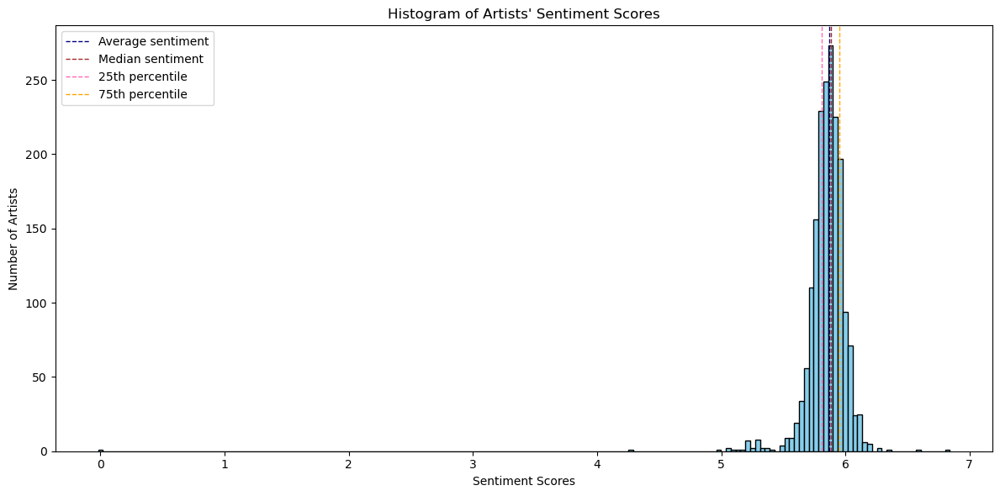

In [62]:
# plot of sentiment distribution 

plt.figure(figsize=(10, 5))

# Create bins for the sentiment scores
min_sentiment = min(sentiments.values())
max_sentiment = max(sentiments.values())
v = np.arange(min_sentiment, max_sentiment + variance_sentiment, variance_sentiment)  

# Count the number of artists in each bin
sentiment_values = list(sentiments.values())
binned_counts, bin_edges = np.histogram(sentiment_values, bins=v)

# bar plot for the histogram
plt.figure(figsize=(12, 6))
plt.bar(bin_edges[:-1], binned_counts, width=np.diff(bin_edges), color='skyblue', edgecolor='black')
# average sentiment line
plt.axvline(average_sentiment, color='navy', linestyle='dashed', linewidth=1)
# median sentiment line
plt.axvline(median_sentiment, color='brown', linestyle='dashed', linewidth=1)
# 25th percentile line
plt.axvline(percentile_25, color='hotpink', linestyle='dashed', linewidth=1)
# 75th percentile line
plt.axvline(percentile_75, color='orange', linestyle='dashed', linewidth=1)
plt.legend(['Average sentiment', 'Median sentiment', '25th percentile', '75th percentile'])
plt.title('Histogram of Artists\' Sentiment Scores')
plt.xlabel('Sentiment Scores')
plt.ylabel('Number of Artists')

plt.tight_layout()
plt.show()


<div style="padding: 15px; border: 4px solid transparent; border-color: transparent; margin-bottom: 10px; border-color: #0078d7; border-radius:4px; max-width: 96%; overflow: hidden;">

The histogram of artists' sentiment scores reflects a near-normal distribution centered around a slightly positive sentiment range, with a score around 6. The average sentiment score is marked with a dashed navy line, showing that most artists' Wikipedia pages exhibit a moderately positive tone. The median sentiment is also close to the average, indicating that there are few extreme variations in sentiment. The 25th and 75th percentiles, represented by the pink and orange dashed lines, show that the interquartile range is narrow, meaning the majority of sentiment scores are clustered within a similar range. There are only a few artists with significantly lower or higher sentiment scores, as evidenced by the minimal counts in the lower and upper tails of the histogram. Among the top 10 happiest artists, bands like *The Flying Burrito Brothers* and *The Bacon Brothers* stand out, likely due to their upbeat, positive style and fanbase. On the other end, artists such as *Flatt and Scruggs* and *Jimmie Rodgers* are among the saddest, reflecting traditional or classic country themes. It is also worth noting that there is one band with a score of 0, likely resulting from incomplete, redirect or wrongly obtained wikitext. Overall, the sentiment scores suggest that the representation of artists in Wikipedia is generally balanced, with slight positivity and little skewness.


</div>

### Discuss the sentiment of the largest communities. 
Do the findings using TF-IDF during Lecture 7 help you understand your results?

Calculate average sentiment of wikipedia pages of artists in the top 10 largest Louvain communities

In [63]:
# calculate average sentiment of 10 largest communities
sentiments_community = pd.DataFrame(louvain_partition.items(), columns=['artist', 'community'])
sentiments_community['sentiment'] = sentiments_community['artist'].map(sentiments)

average_sentiments_community = sentiments_community.groupby('community')['sentiment'].mean().to_dict()
print("Average sentiment of 10 largest communities:")
for community in sorted(average_sentiments_community, key=average_sentiments_community.get, reverse=True)[:10]:
    print(f"Community {community}: {average_sentiments_community[community]}")

Average sentiment of 10 largest communities:
Community 3: 6.056570622529108
Community 10: 5.913836427151691
Community 9: 5.894634963326561
Community 0: 5.878817638140573
Community 5: 5.868793817511789
Community 4: 5.8477376948930795
Community 7: 5.8476889277366695
Community 6: 5.83895468923701
Community 1: 5.835912837179963
Community 8: 5.832713795754172


In [64]:
# 3 happiest communities
happiest_communities = sorted(average_sentiments_community, key=average_sentiments_community.get, reverse=True)[:3]
print("3 happiest communities:")
for community in happiest_communities:
    print(f"Community {community}: {average_sentiments_community[community]}")

    

3 happiest communities:
Community 3: 6.056570622529108
Community 10: 5.913836427151691
Community 9: 5.894634963326561


In [65]:
# 3 saddest communities
saddest_communities = sorted(average_sentiments_community, key=average_sentiments_community.get, reverse=False)[:3]
print("3 saddest communities:")
for community in saddest_communities:
    print(f"Community {community}: {average_sentiments_community[community]}")

3 saddest communities:
Community 2: 5.817068624472899
Community 8: 5.832713795754172
Community 1: 5.835912837179963


Plot and compare the distribution of sentiment in the happiest and saddest communities

<Figure size 1000x500 with 0 Axes>

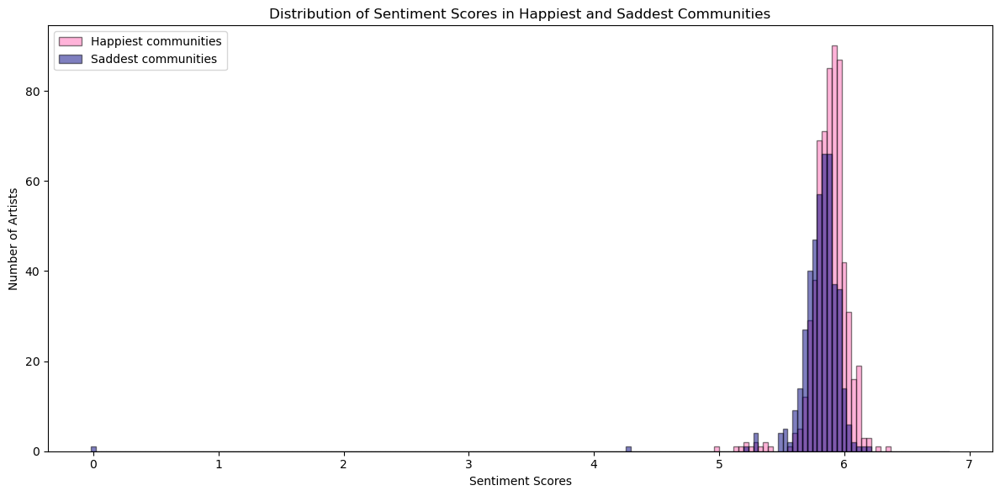

In [66]:
# plot distribution of sentiment scores in happiest and saddest communities
plt.figure(figsize=(10, 5))

# Create bins for the sentiment scores
min_sentiment = min(sentiments.values())
max_sentiment = max(sentiments.values())
v = np.arange(min_sentiment, max_sentiment + variance_sentiment, variance_sentiment)

# Count the number of artists in each bin
sentiments_happy = sentiments_community[sentiments_community['community'].isin(happiest_communities)]['sentiment']
binned_counts_happy, bin_edges = np.histogram(sentiments_happy, bins=v)

sentiments_sad = sentiments_community[sentiments_community['community'].isin(saddest_communities)]['sentiment']
binned_counts_sad, bin_edges = np.histogram(sentiments_sad, bins=v)

# bar plot for the histogram
plt.figure(figsize=(12, 6))
plt.bar(bin_edges[:-1], binned_counts_happy, width=np.diff(bin_edges), color='hotpink', edgecolor='black', alpha=0.5)
plt.bar(bin_edges[:-1], binned_counts_sad, width=np.diff(bin_edges), color='navy', edgecolor='black', alpha=0.5)
plt.legend(['Happiest communities', 'Saddest communities'])
plt.title('Distribution of Sentiment Scores in Happiest and Saddest Communities')
plt.xlabel('Sentiment Scores')
plt.ylabel('Number of Artists')

plt.tight_layout()
plt.show()


<div style="padding: 15px; border: 4px solid transparent; border-color: transparent; margin-bottom: 10px; border-color: #0078d7; border-radius:4px; max-width: 96%; overflow: hidden;">

Looking at the results, the sentiment of the largest Louvain communities in the artist network varies but the average sentiment scores indicate a generally positive tone across all communities. 

The distribution of sentiment scores for the happiest and saddest communities reveals differences between these groups. The happiest communities have sentiment scores clustered around the higher end of the sentiment spectrum, with a peak near the same general positive range observed in the overall distribution. This suggests that the majority of the artists in these communities tend to feature more favorable or positive descriptions. Conversely, the saddest communities  exhibit a distribution that is slightly shifted towards lower sentiment scores, although still centered around a relatively positive range. This slight skew implies that even the saddest communities maintain an overall positive sentiment but include a bigger proportion of artists or terms with less enthusiastic descriptions. The overlap between the distributions highlights that, while some variation exists, the communities are generally positively described, with subtle differences in sentiment intensity between the happiest and saddest groups.


Findings using TF-IDF provide valuable context for interpreting the sentiment distribution results across the happiest and saddest communities. By identifying the most distinctive terms associated with each community, TF-IDF helps revealing thematic or cultural elements that might influence sentiment scores. For example, communities where words related to **awards**, **achievements** or **popular figures**, like *Grammy*, *Lovato* or *Bieber*, dominate are more likely to have positive sentiment scores, as these terms are associated with recognition and success. In contrast, saddest communities tend to include vocabulary that, while not necessarily negative, may reflect more complex themes, such as **traditional genres** \(e.g., bluegrass\) or **historical figures** related to struggles or cultural elements. These subtle differences in community-specific vocabulary help explain why happier communities generally exhibit more positive sentiment, while saddest communities lean toward a more balanced or neutral tone.

Additionally, genre plays a significant role in shaping sentiment scores. For instance, **Pop**, which is highly related to **Community 9**, is associated with positive cultural connotations, while **Country**, traditionally connected to personal hardships, seems to influence sentiment toward the lower end, as seen in **Community 2**, which includes a lot of country artists, who often reflect on themes of loss and nostalgia.

Summing up, by examining the TF-IDF results, the confusion matrix **D** and the sentiment scores distributions, we gain a better understanding of how distinctive vocabulary reflects the communities and about the network's interconnections and structure.

</div>